In [1]:
import os
os.chdir('../')
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pickle
from scipy.spatial.distance import correlation

In [2]:
with open('cache/thingseeg2_preproc/regression_weights/thingseeg2_regress_cliptext_weights_800ms_1regressor_0a.pkl',"rb") as f:
    datadict = pickle.load(f)
    reg_w = datadict['weight']
    reg_b = datadict['bias']

In [3]:
train_clip = np.load('cache/thingseeg2_preproc/extracted_embeddings/train_cliptext.npy', mmap_mode='r')
test_clip = np.load('cache/thingseeg2_preproc/extracted_embeddings/test_cliptext.npy', mmap_mode='r')
train_clip_flattened = train_clip.reshape(train_clip.shape[0], -1)
test_clip_flattened = test_clip.reshape(test_clip.shape[0], -1)
train_clip_flattened.shape, test_clip_flattened.shape

((16540, 59136), (200, 59136))

In [4]:
# train_path = 'data/things-eeg2_preproc/train_thingseeg2_avg.npy'
# train_path = 'data/things-eeg2_preproc/train_thingseeg2_avg_200ms.npy'
# train_path = 'data/things-eeg2_preproc/train_thingseeg2_avg_400ms.npy'
# train_path = 'data/things-eeg2_preproc/train_thingseeg2_avg_600ms.npy'
train_path = 'data/things-eeg2_preproc/train_thingseeg2_avg_800ms.npy'
# train_path = 'data/things-eeg2_preproc/train_thingseeg2_null.npy'
# train_path = 'data/thingseeg2/train_thingseeg2_avg1_200ms.npy'
# train_path = 'data/thingseeg2/train_thingseeg2_avg1_400ms.npy'
# train_path = 'data/thingseeg2/train_thingseeg2_avg1_600ms.npy'
# train_path = 'data/thingseeg2/train_thingseeg2_avg1_800ms.npy'
train_meg = np.load(train_path, mmap_mode='r')
train_meg_flattened = train_meg.reshape(train_meg.shape[0], -1)
# test_path = 'data/things-eeg2_preproc/test_thingseeg2_avg.npy'
# test_path = 'data/things-eeg2_preproc/test_thingseeg2_avg_200ms.npy'
# test_path = 'data/things-eeg2_preproc/test_thingseeg2_avg_400ms.npy'
# test_path = 'data/things-eeg2_preproc/test_thingseeg2_avg_600ms.npy'
test_path = 'data/things-eeg2_preproc/test_thingseeg2_avg_800ms.npy'
# test_path = 'data/things-eeg2_preproc/test_thingseeg2_null.npy'
# test_path = 'data/thingseeg2/test_thingseeg2_avg1_200ms.npy'
# test_path = 'data/thingseeg2/test_thingseeg2_avg1_400ms.npy'
# test_path = 'data/thingseeg2/test_thingseeg2_avg1_600ms.npy'
# test_path = 'data/thingseeg2/test_thingseeg2_avg1_800ms.npy'
test_meg = np.load(test_path, mmap_mode='r')
test_meg_flattened = test_meg.reshape(test_meg.shape[0], -1)
print(train_meg.shape, test_meg.shape, train_meg_flattened.shape, test_meg_flattened.shape)

(16540, 17, 80) (200, 17, 80) (16540, 1360) (200, 1360)


In [5]:
X_pred = np.dot(test_clip_flattened - reg_b, np.linalg.pinv(reg_w.T))
std_norm_X_pred = (X_pred - np.mean(X_pred,axis=0)) / np.std(X_pred,axis=0)
X_pred = std_norm_X_pred * np.std(train_meg_flattened,axis=0) + np.mean(train_meg_flattened,axis=0)
print('Input prediction MSE:', mean_squared_error(test_meg_flattened, X_pred))

Input prediction MSE: 0.3528309056571115


In [6]:
correlation_distances = np.array([correlation(u, v) for u, v in zip(X_pred, test_meg_flattened)])
correlations = (1 - correlation_distances).mean()

print(correlations)

0.4606849951365457


In [7]:
# plt.plot(test_meg[0].T);

In [8]:
pred_meg_flattened = np.load('cache/thingseeg2_preproc/predicted_embeddings/thingseeg2_regress_cliptext_800ms_1regressor_inverted.npy', mmap_mode='r')
pred_meg = pred_meg_flattened.reshape(test_meg.shape)
pred_meg.shape

(200, 17, 80)

## hand-picked

In [9]:
not_much = [1, 7, 15, 16, 25, 34, 43, 44, 65, 68, 75, 76, 95, 153, 159, 170, 174, 199]
animals = [11, 32, 38, 62, 71, 86, 87, 128, 132, 136, 141, 143, 151]
vehicles = [24, 30, 83, 99, 114, 196]
# food = [26, 28, 31, 47]
food = [53, 28, 56, 158]
clothings = [36, 51, 93, 117, 175, 176]

In [10]:
not_much_real = test_meg[not_much]
animals_real = test_meg[animals]
vehicles_real = test_meg[vehicles]
food_real = test_meg[food]
clothings_real = test_meg[clothings]

animals_pred = pred_meg[animals]
vehicles_pred = pred_meg[vehicles]
food_pred = pred_meg[food]
clothings_pred = pred_meg[clothings]

In [11]:
not_much_real__cat_pred__20_40 = not_much_real.copy()
not_much_real__cat_pred__20_40[...,20:40] = animals_pred[1,:,20:40]

not_much_real__cat_real__20_40 = not_much_real.copy()
not_much_real__cat_real__20_40[...,20:40] = animals_real[1,:,20:40]

In [12]:
not_much_real__cat_pred__0_20 = not_much_real.copy()
not_much_real__cat_pred__0_20[...,0:20] = animals_pred[1,:,0:20]

not_much_real__cat_real__0_20 = not_much_real.copy()
not_much_real__cat_real__0_20[...,0:20] = animals_real[1,:,0:20]

In [20]:
not_much_real__cat_pred__0_80 = not_much_real.copy()
not_much_real__cat_pred__0_80[...,0:80] = animals_pred[1,:,0:80]

not_much_real__cat_real__0_80 = not_much_real.copy()
not_much_real__cat_real__0_80[...,0:80] = animals_real[1,:,0:80]

In [21]:
dir = 'cache/thingseeg2_synthetic/'
if not os.path.exists(dir):
   os.makedirs(dir)
np.save(dir + 'not_much_real__cat_pred__20_40_800ms.npy', not_much_real__cat_pred__20_40)
np.save(dir + 'not_much_real__cat_real__20_40_800ms.npy', not_much_real__cat_real__20_40)
np.save(dir + 'not_much_real__cat_pred__0_20_800ms.npy', not_much_real__cat_pred__0_20)
np.save(dir + 'not_much_real__cat_real__0_20_800ms.npy', not_much_real__cat_real__0_20)
np.save(dir + 'not_much_real__cat_pred__0_80_800ms.npy', not_much_real__cat_pred__0_80)
np.save(dir + 'not_much_real__cat_real__0_80_800ms.npy', not_much_real__cat_real__0_80)

### examples

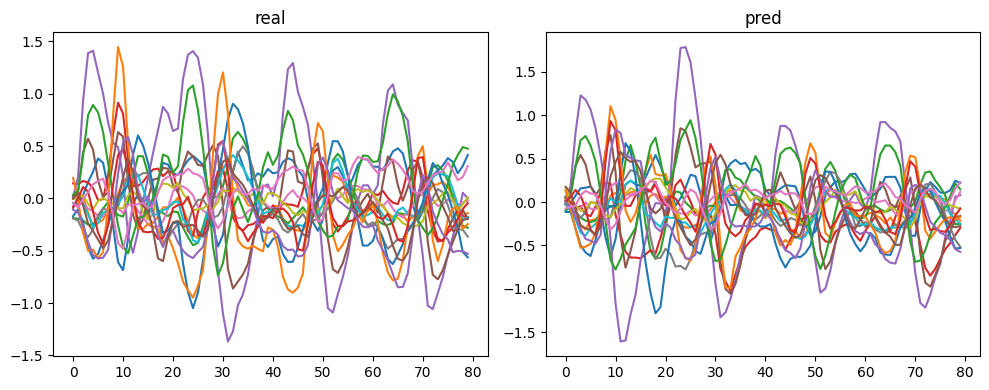

In [25]:
not_much_real__cat_real__0_80 = not_much_real.copy()
not_much_real__cat_real__0_80[...,0:80] = animals_real[1,:,0:80]
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(not_much_real[0].T);
axs[0].set_title('real')
axs[1].plot(not_much_real__cat_real__0_80[0].T);
axs[1].set_title('pred')
# fig.suptitle('coverall')
plt.tight_layout()
plt.show()

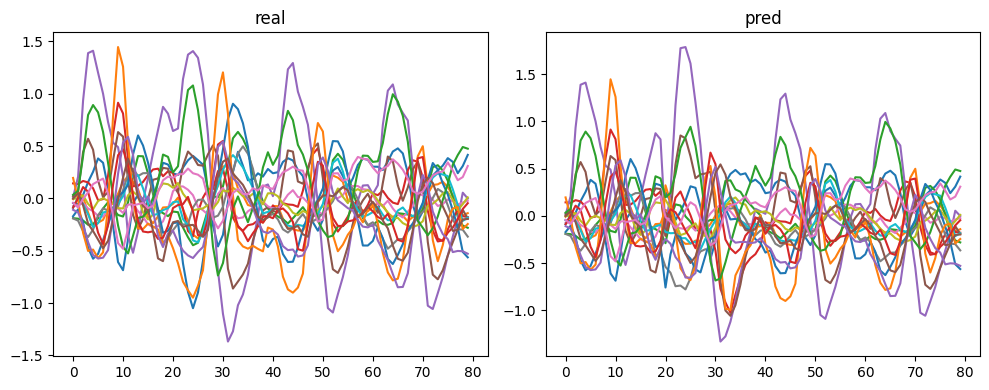

In [69]:
not_much_real__cat_real__20_40 = not_much_real.copy()
not_much_real__cat_real__20_40[...,20:40] = animals_real[1,:,20:40]
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(not_much_real[0].T);
axs[0].set_title('real')
axs[1].plot(not_much_real__cat_real__20_40[0].T);
axs[1].set_title('pred')
# fig.suptitle('coverall')
plt.tight_layout()
plt.show()

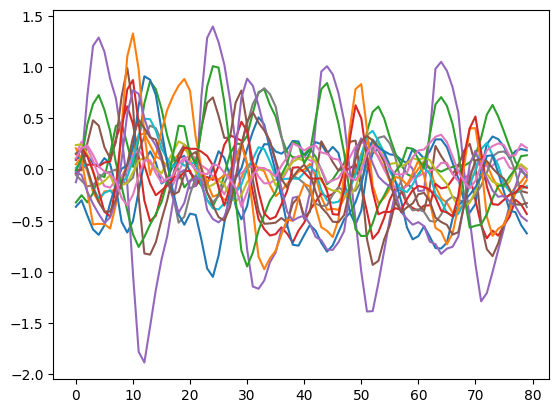

In [31]:
plt.plot(test_meg_flattened.reshape(test_meg.shape)[11].T);

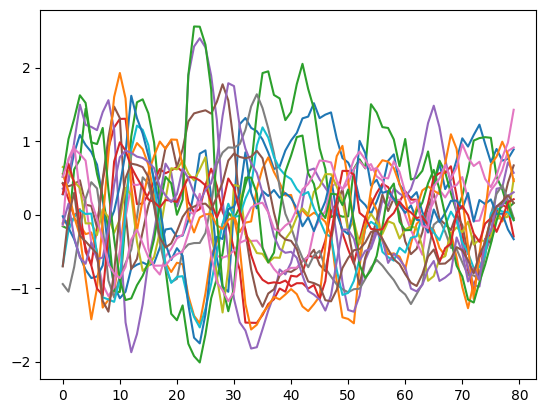

In [32]:
plt.plot(pred_meg[11].T);

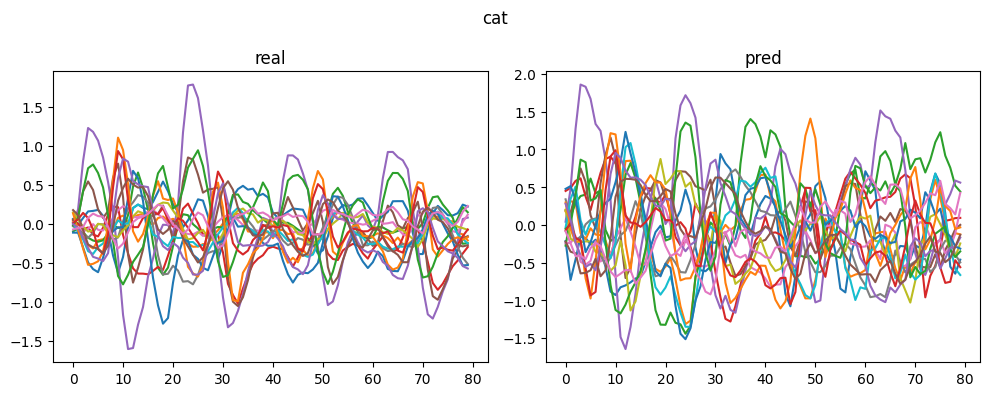

In [40]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[32].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[32].T);
axs[1].set_title('pred')

fig.suptitle('cat')
plt.tight_layout()
plt.show()

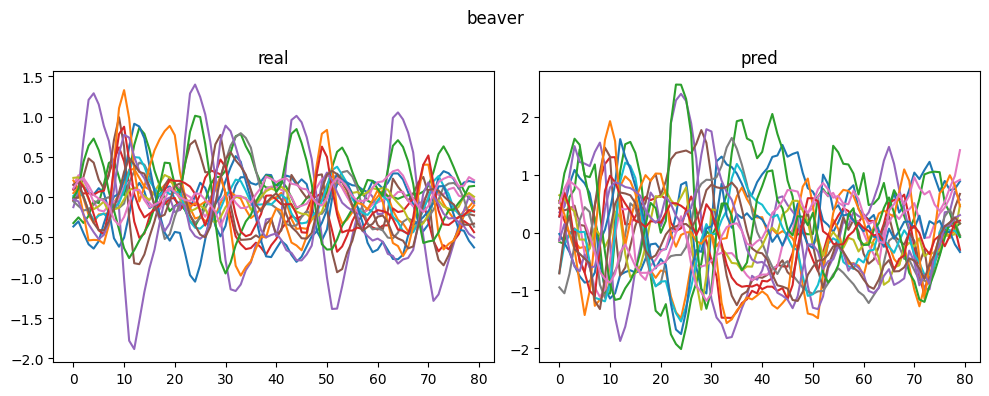

In [42]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[11].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[11].T);
axs[1].set_title('pred')

fig.suptitle('beaver')
plt.tight_layout()
plt.show()

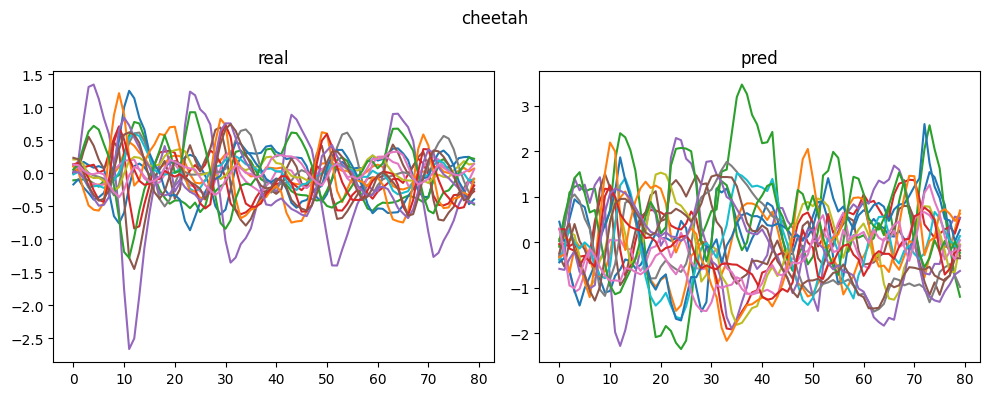

In [43]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[38].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[38].T);
axs[1].set_title('pred')

fig.suptitle('cheetah')
plt.tight_layout()
plt.show()

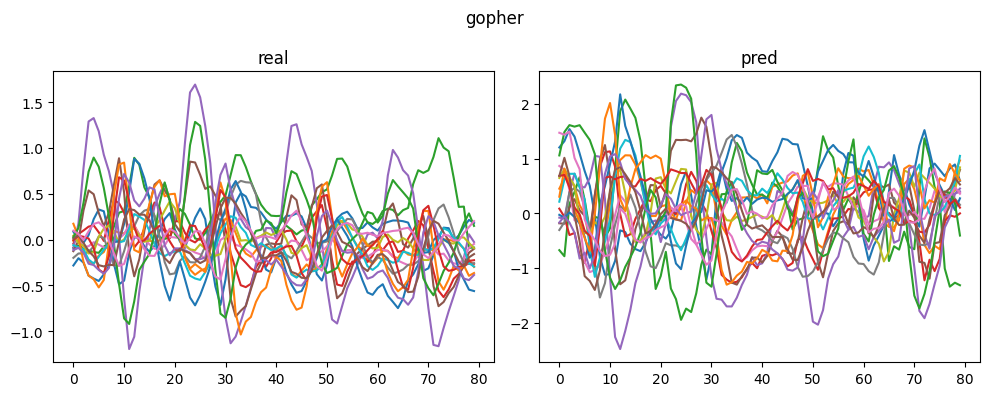

In [44]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[86].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[86].T);
axs[1].set_title('pred')

fig.suptitle('gopher')
plt.tight_layout()
plt.show()

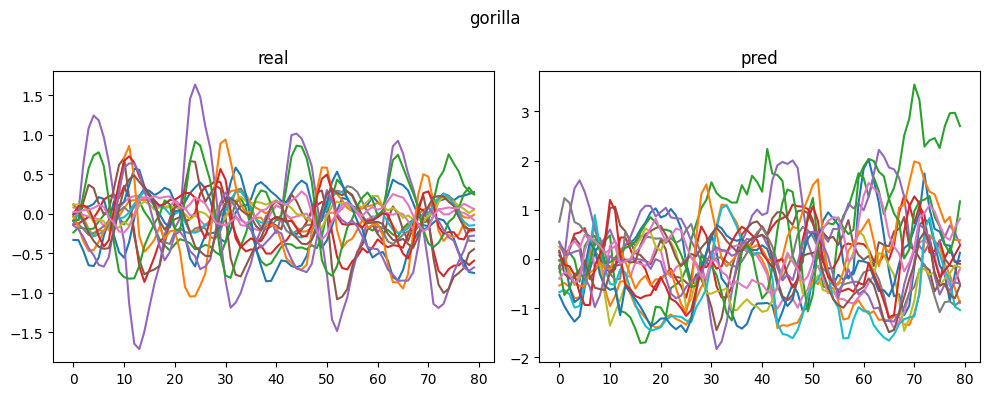

In [45]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[39].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[39].T);
axs[1].set_title('pred')

fig.suptitle('gorilla')
plt.tight_layout()
plt.show()

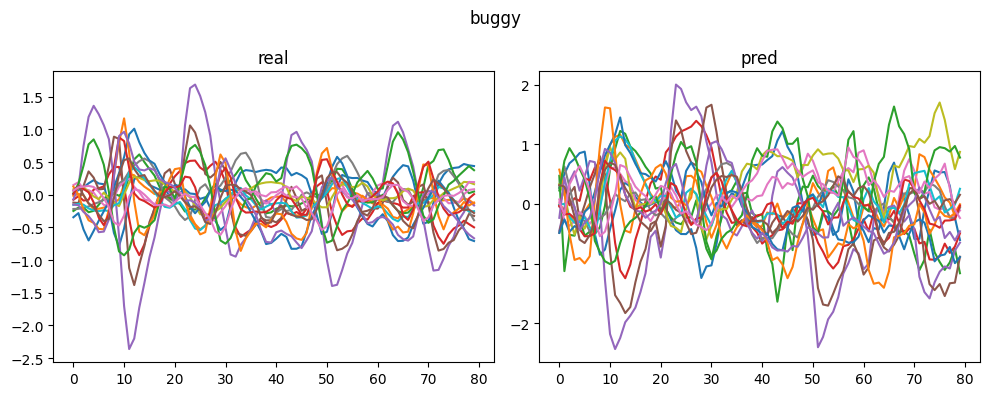

In [46]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[24].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[24].T);
axs[1].set_title('pred')

fig.suptitle('buggy')
plt.tight_layout()
plt.show()

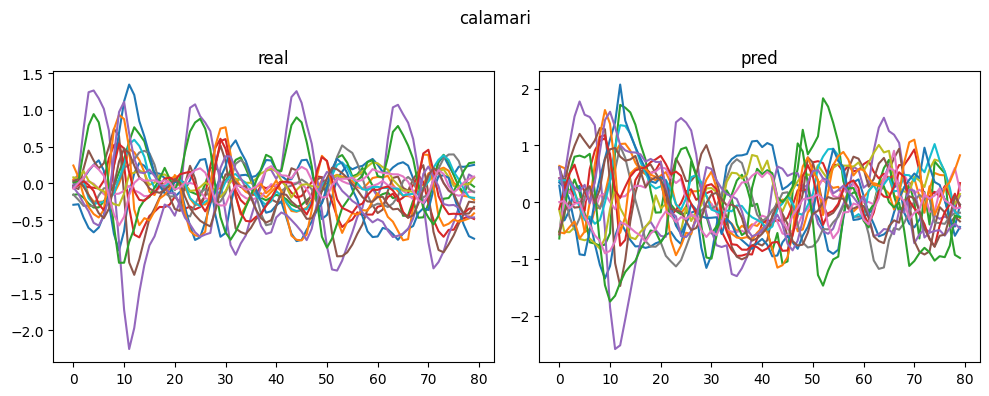

In [47]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[28].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[28].T);
axs[1].set_title('pred')

fig.suptitle('calamari')
plt.tight_layout()
plt.show()

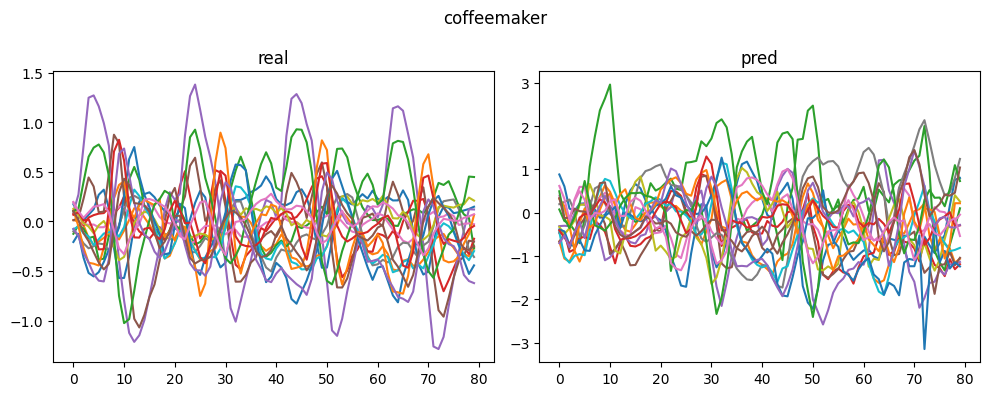

In [48]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[48].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[48].T);
axs[1].set_title('pred')

fig.suptitle('coffeemaker')
plt.tight_layout()
plt.show()

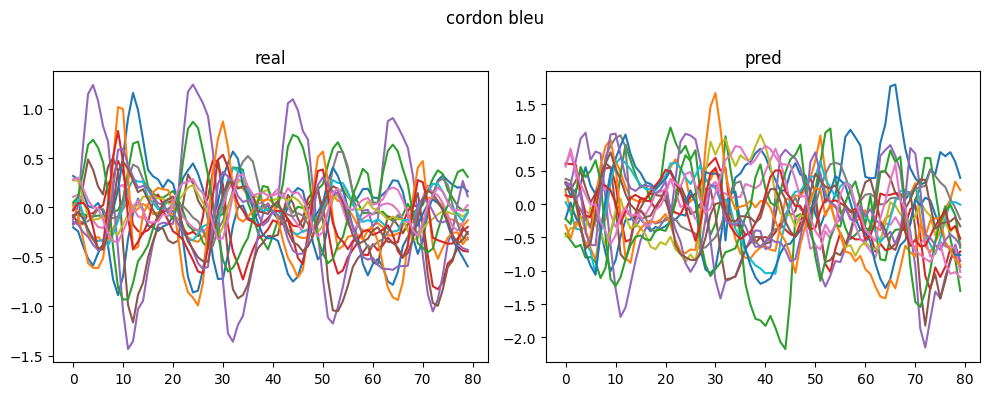

In [49]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[50].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[50].T);
axs[1].set_title('pred')

fig.suptitle('cordon bleu')
plt.tight_layout()
plt.show()

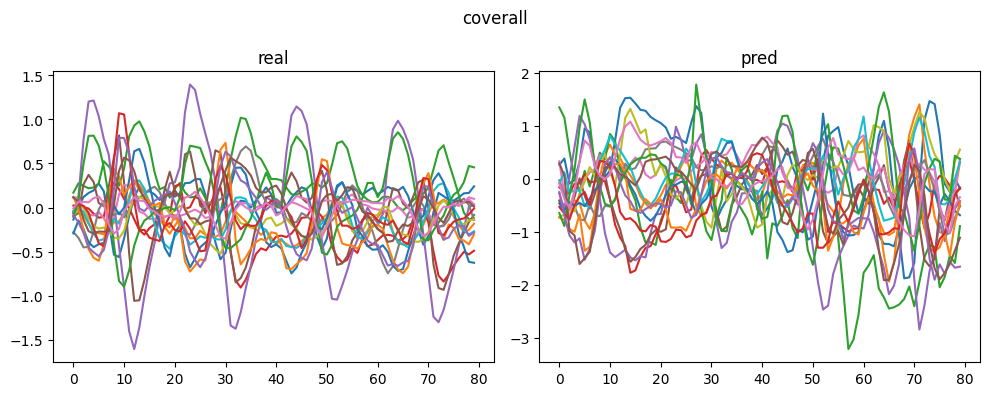

In [50]:
# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Plot data on each subplot
axs[0].plot(test_meg[51].T);
axs[0].set_title('real')
axs[1].plot(pred_meg[51].T);
axs[1].set_title('pred')

fig.suptitle('coverall')
plt.tight_layout()
plt.show()

### not much

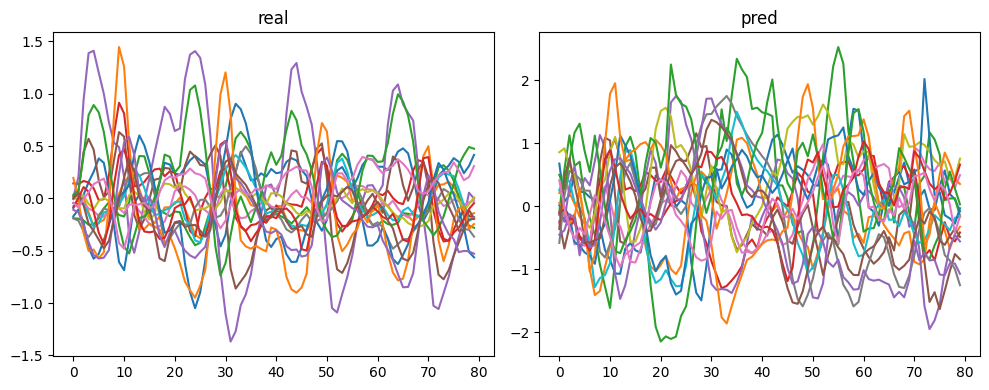

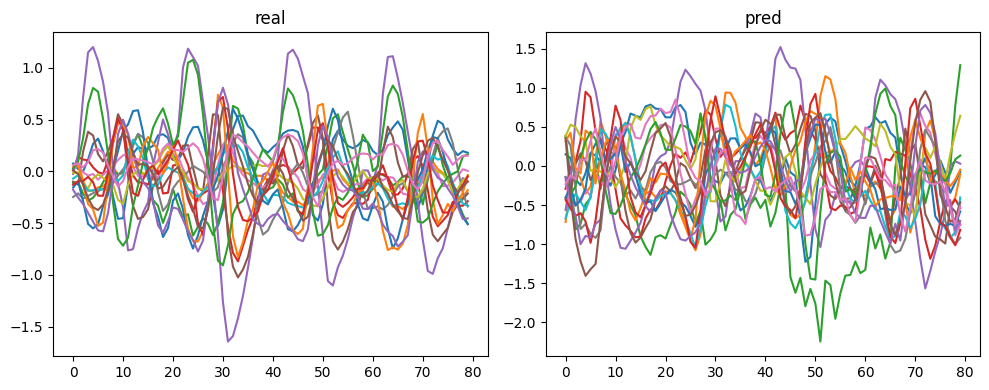

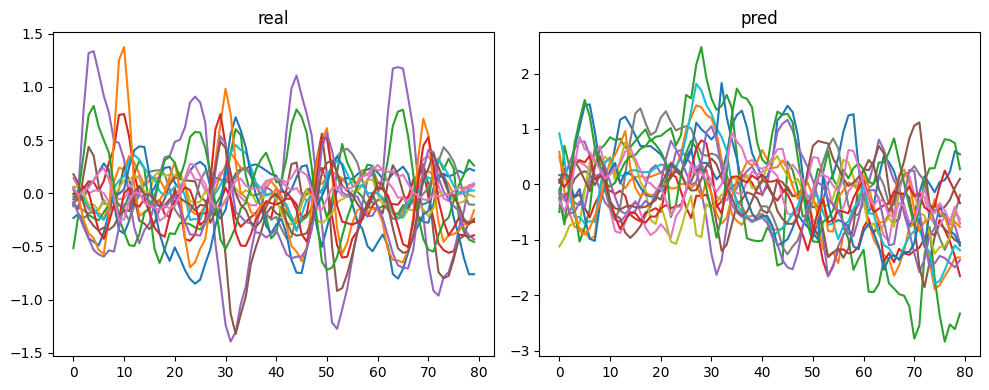

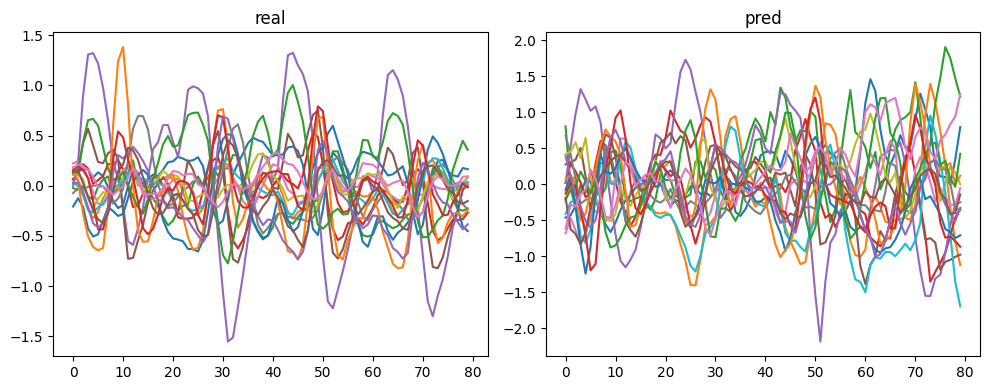

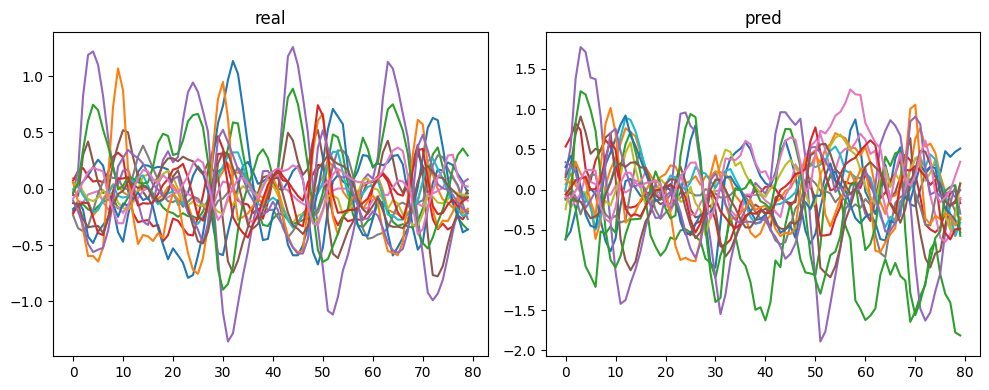

...

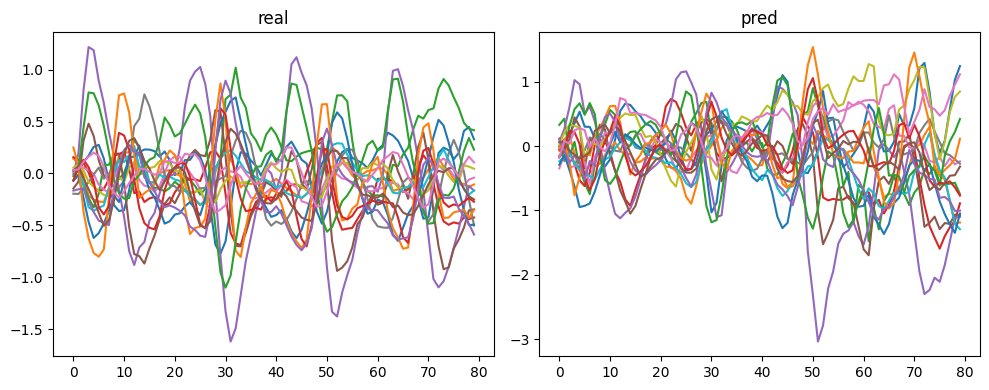

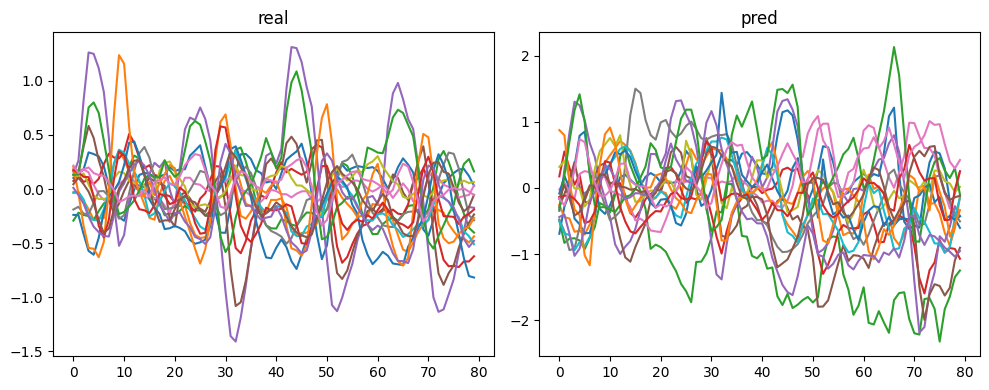

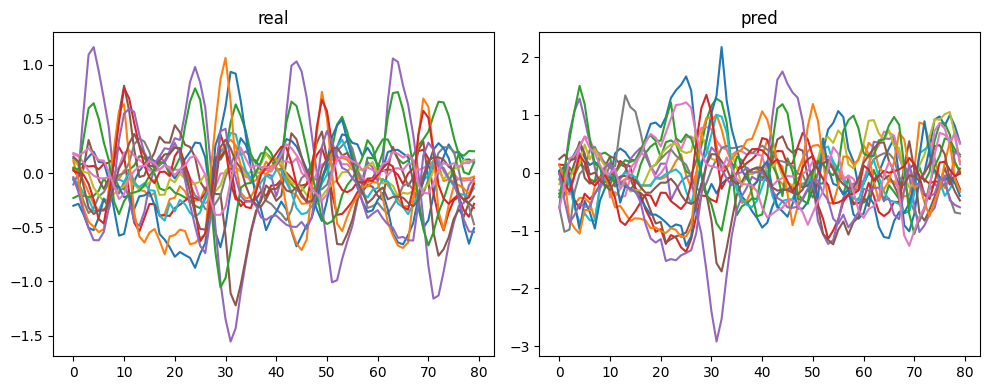

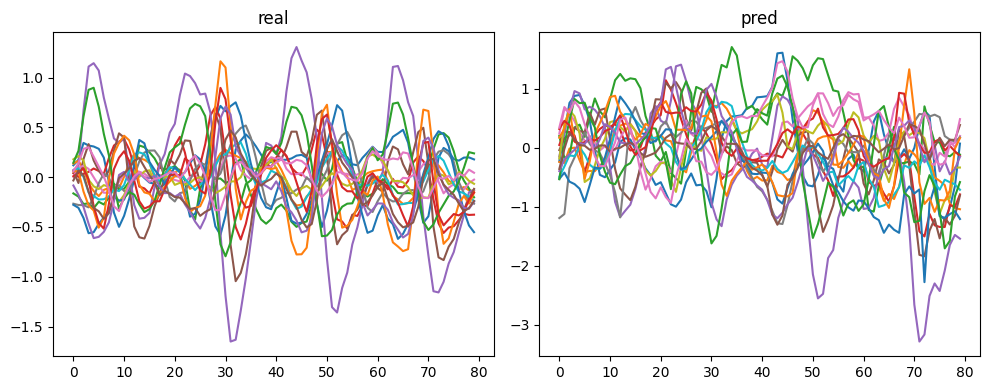

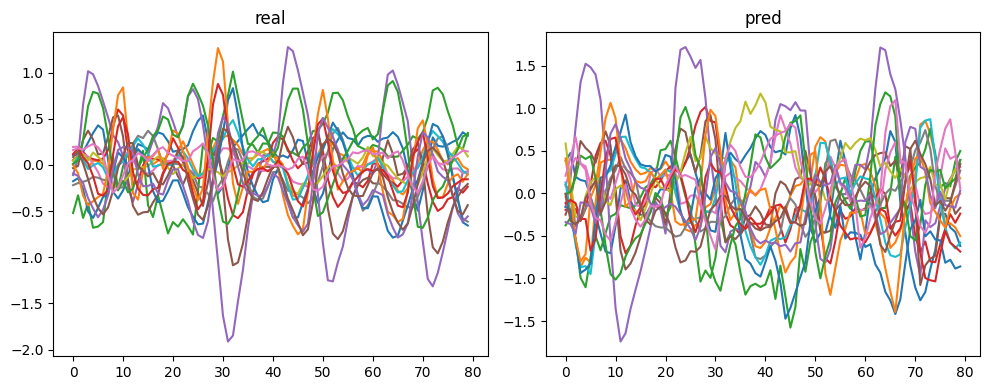

In [53]:
for ind in not_much:
    # Create a figure and a set of subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    # Plot data on each subplot
    axs[0].plot(test_meg[ind].T);
    axs[0].set_title('real')
    axs[1].plot(pred_meg[ind].T);
    axs[1].set_title('pred')
    # fig.suptitle('coverall')
    plt.tight_layout()
    plt.show()

### animals

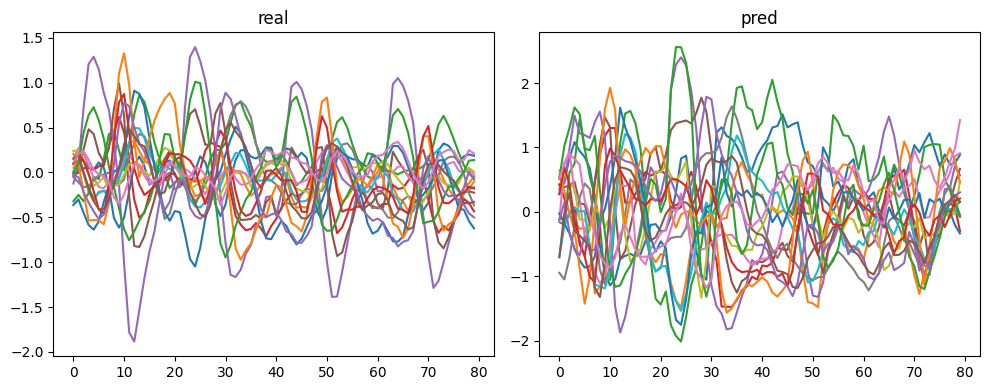

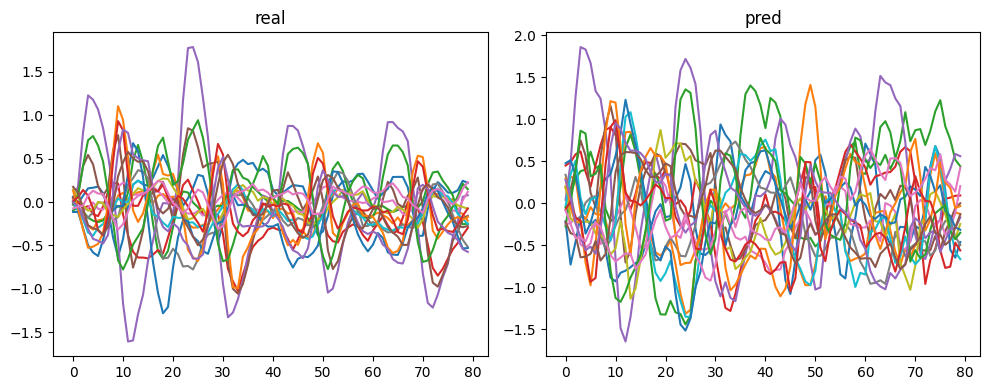

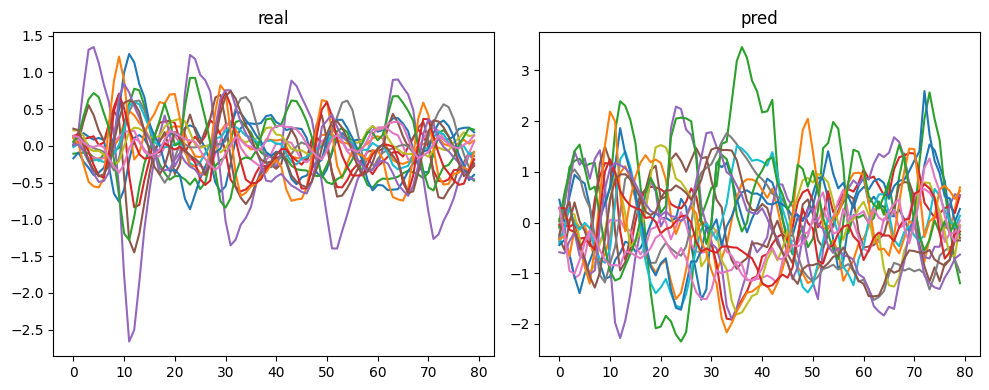

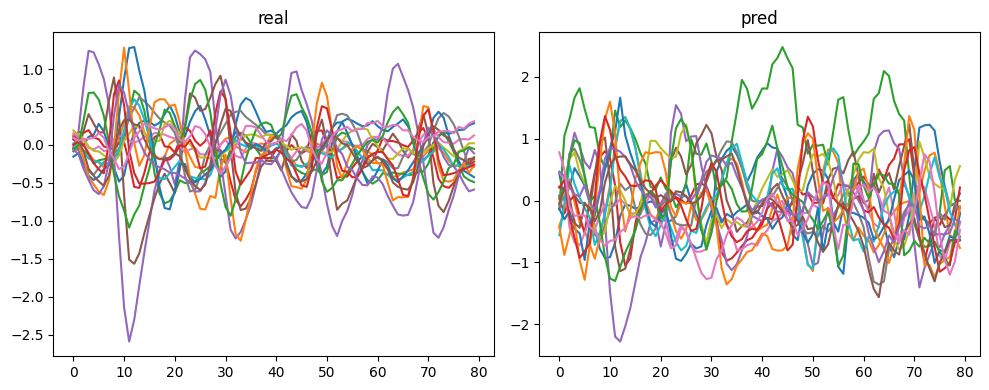

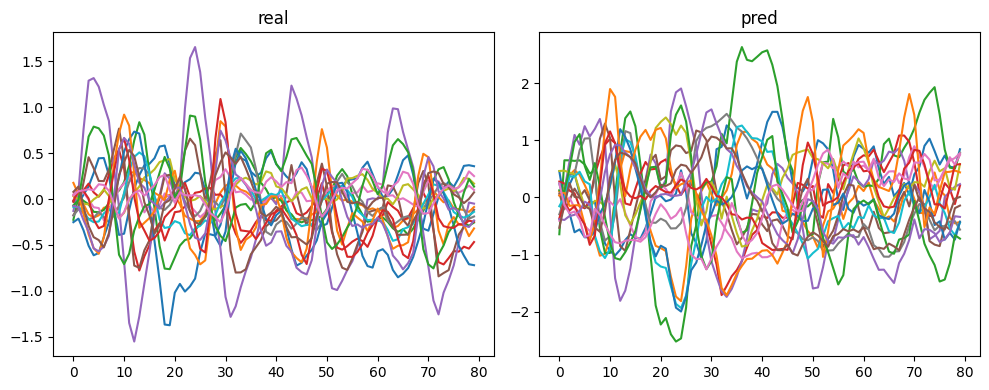

...

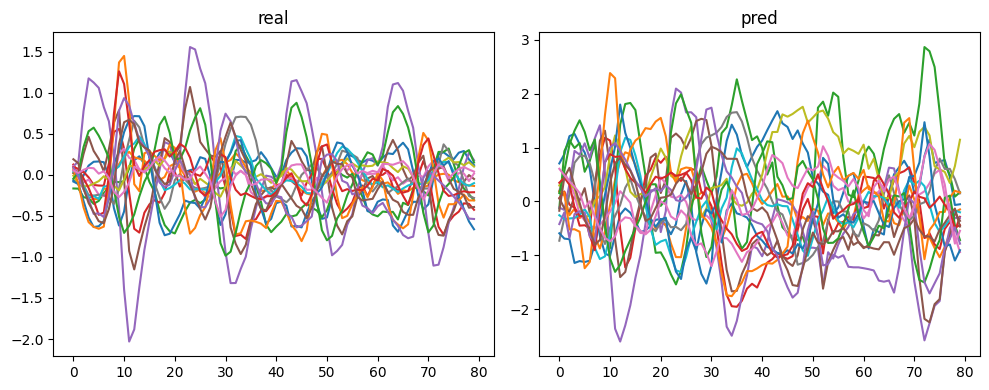

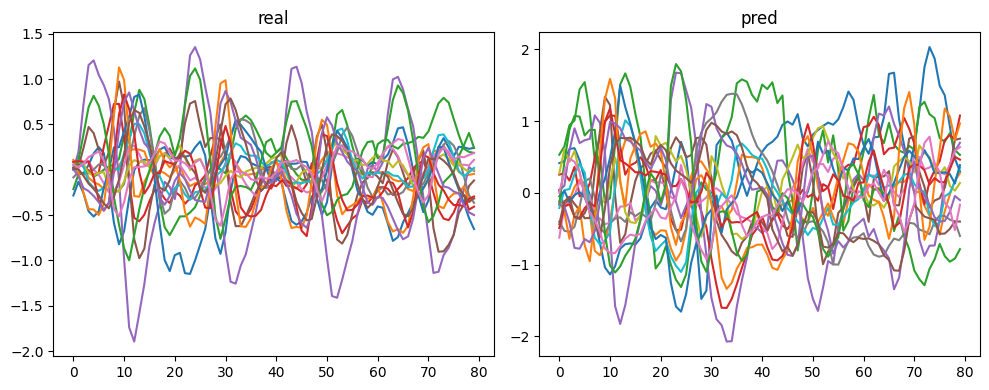

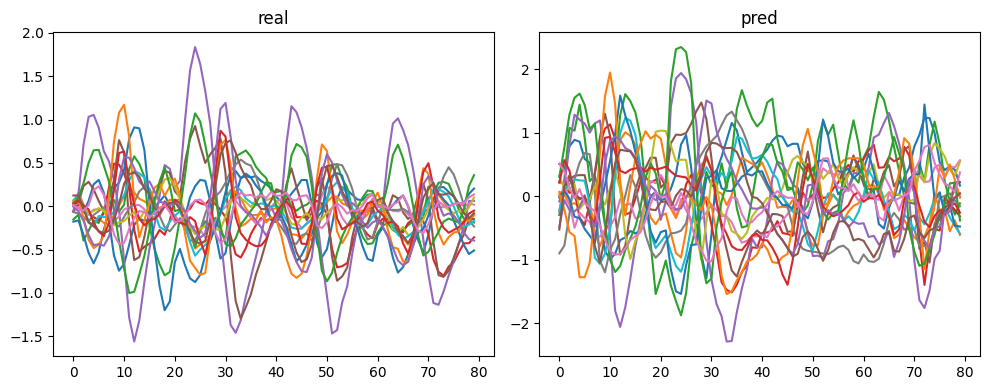

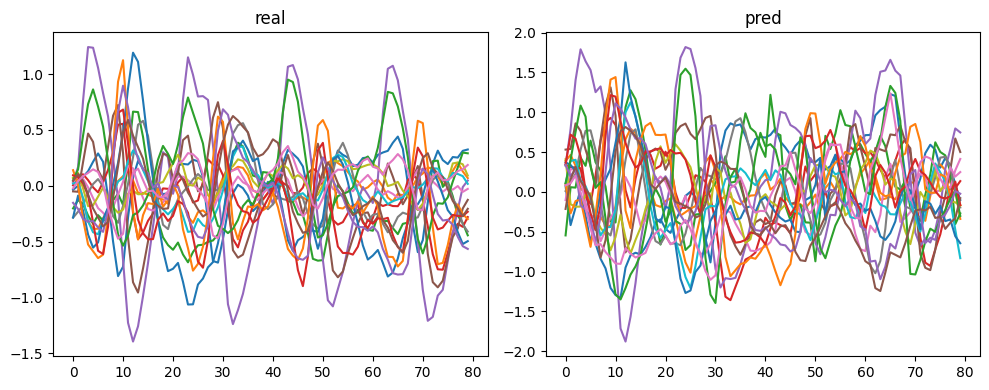

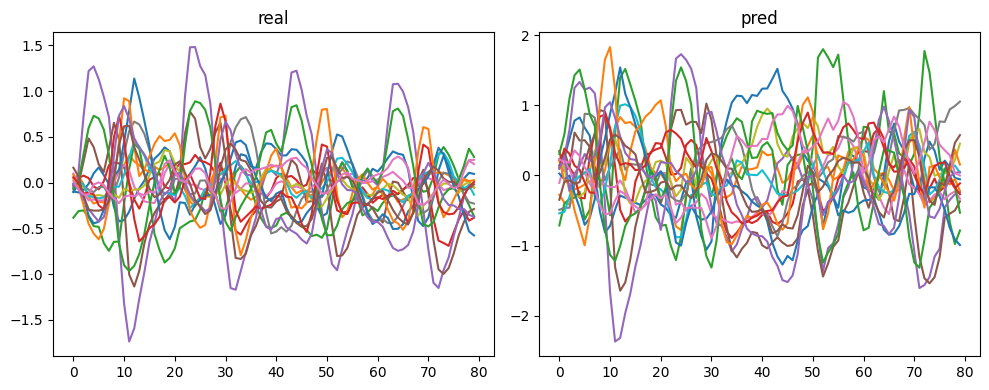

In [54]:
for ind in animals:
    # Create a figure and a set of subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    # Plot data on each subplot
    axs[0].plot(test_meg[ind].T);
    axs[0].set_title('real')
    axs[1].plot(pred_meg[ind].T);
    axs[1].set_title('pred')
    # fig.suptitle('coverall')
    plt.tight_layout()
    plt.show()

### vehicles

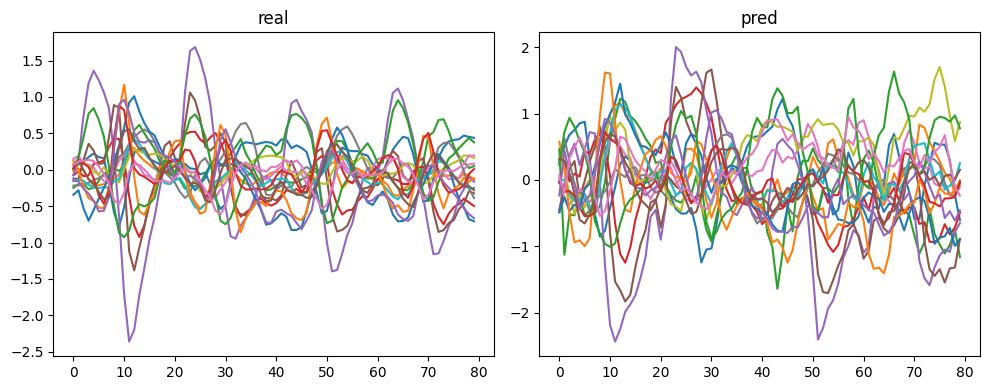

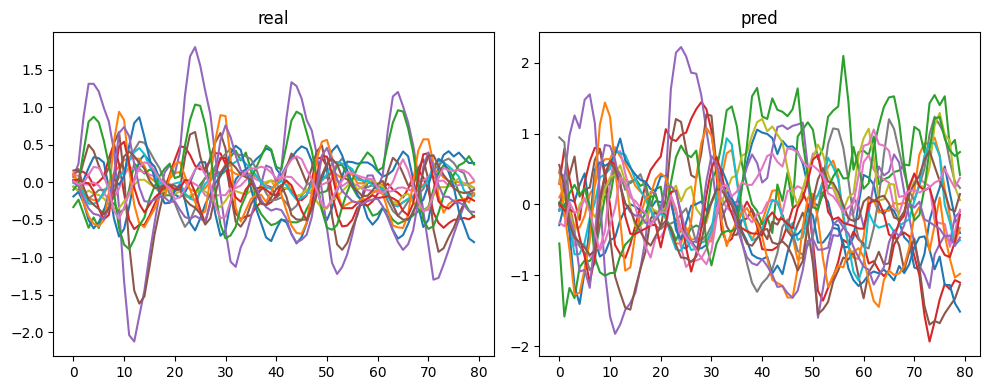

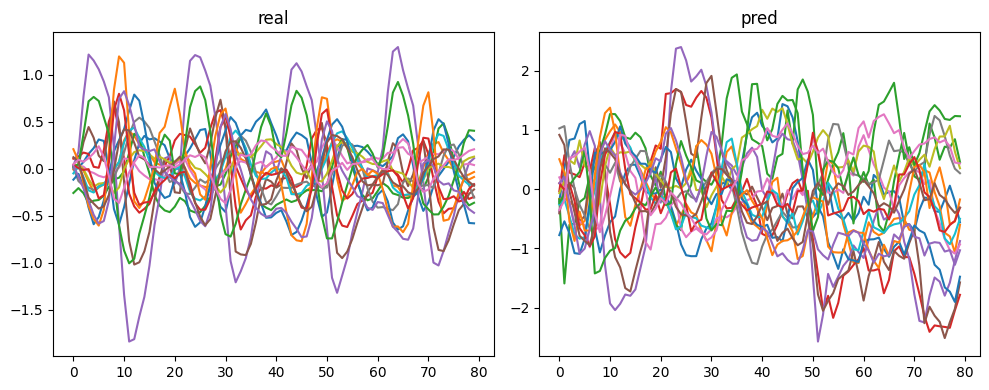

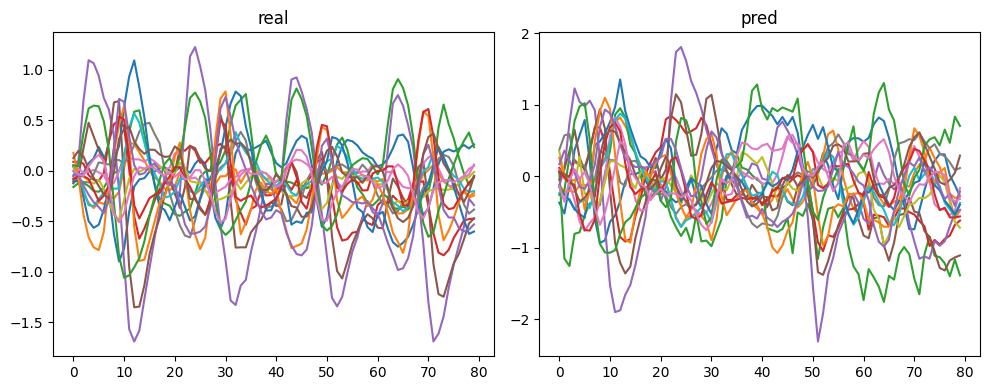

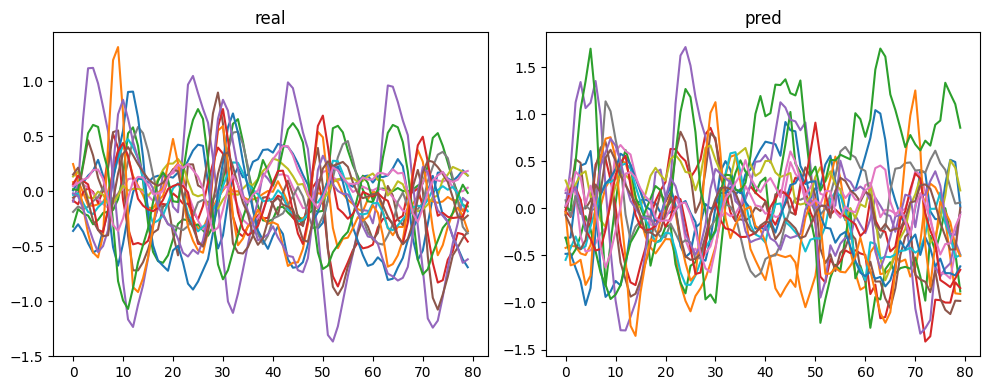

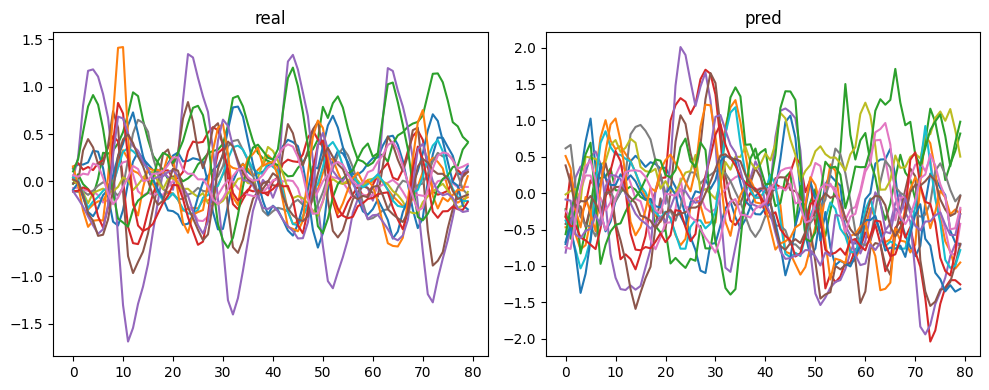

In [55]:
for ind in vehicles:
    # Create a figure and a set of subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    # Plot data on each subplot
    axs[0].plot(test_meg[ind].T);
    axs[0].set_title('real')
    axs[1].plot(pred_meg[ind].T);
    axs[1].set_title('pred')
    # fig.suptitle('coverall')
    plt.tight_layout()
    plt.show()

### food

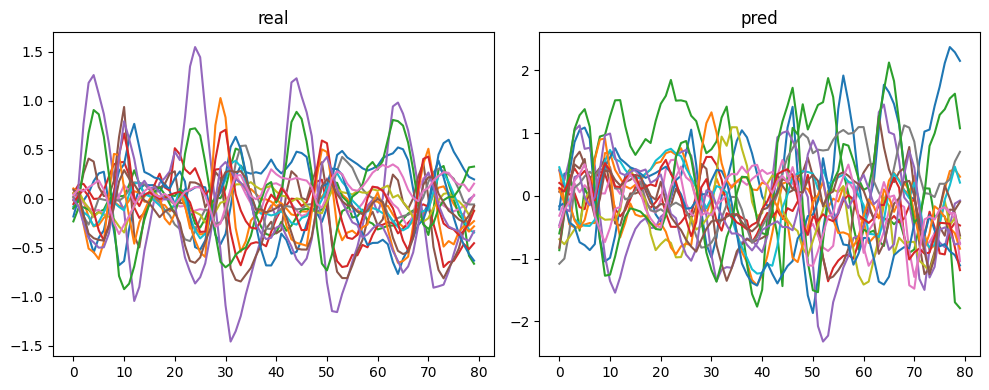

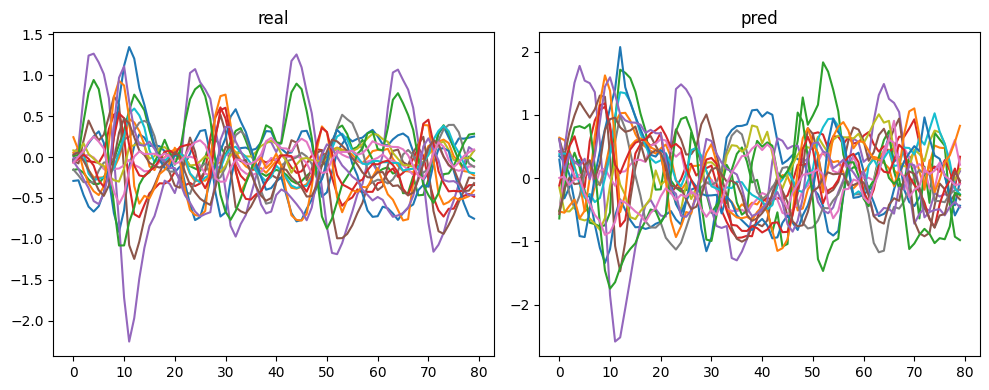

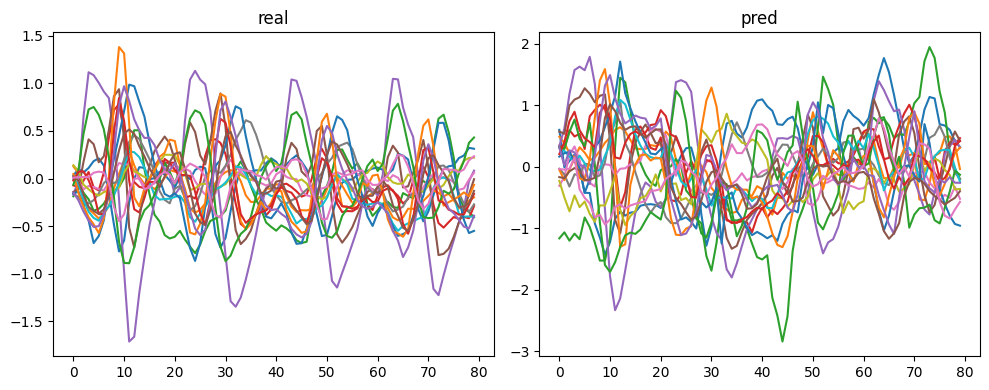

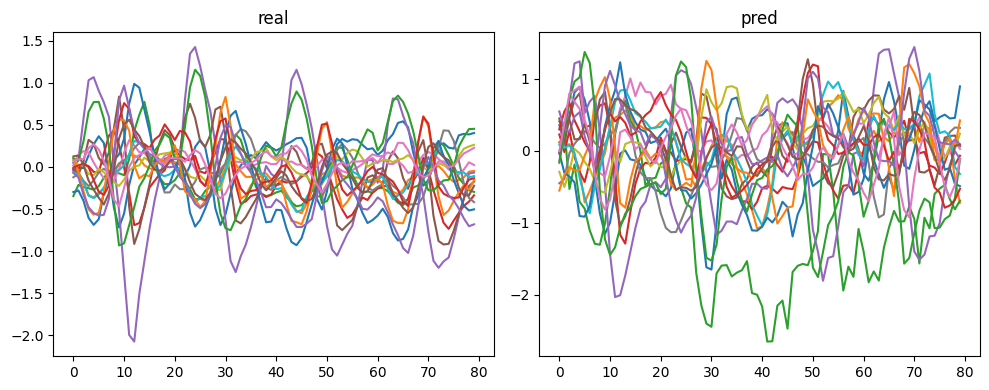

In [56]:
for ind in food:
    # Create a figure and a set of subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    # Plot data on each subplot
    axs[0].plot(test_meg[ind].T);
    axs[0].set_title('real')
    axs[1].plot(pred_meg[ind].T);
    axs[1].set_title('pred')
    # fig.suptitle('coverall')
    plt.tight_layout()
    plt.show()

### clothings

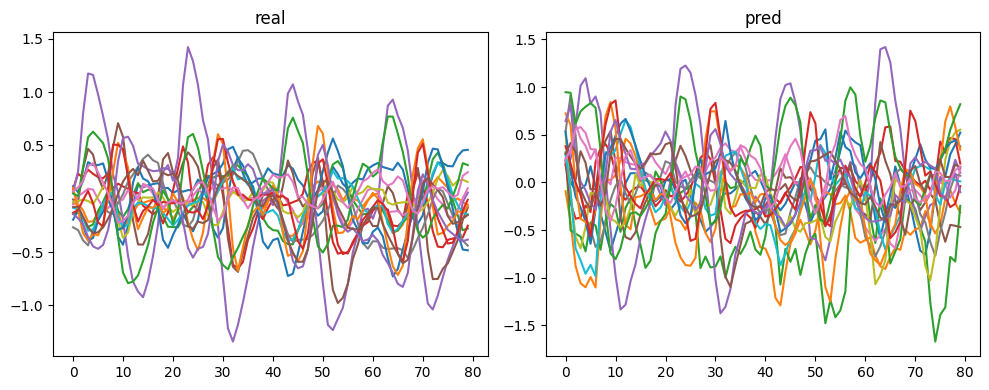

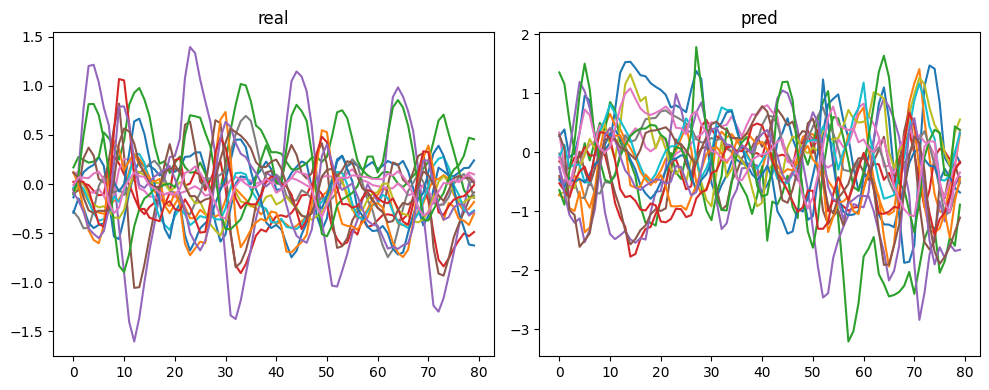

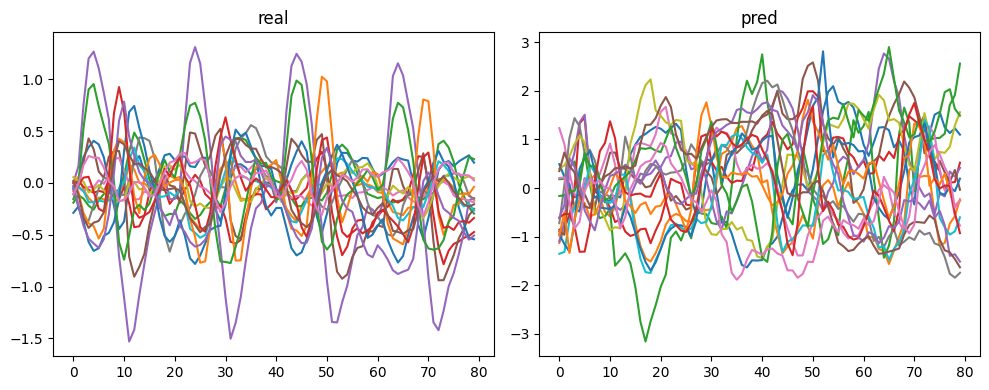

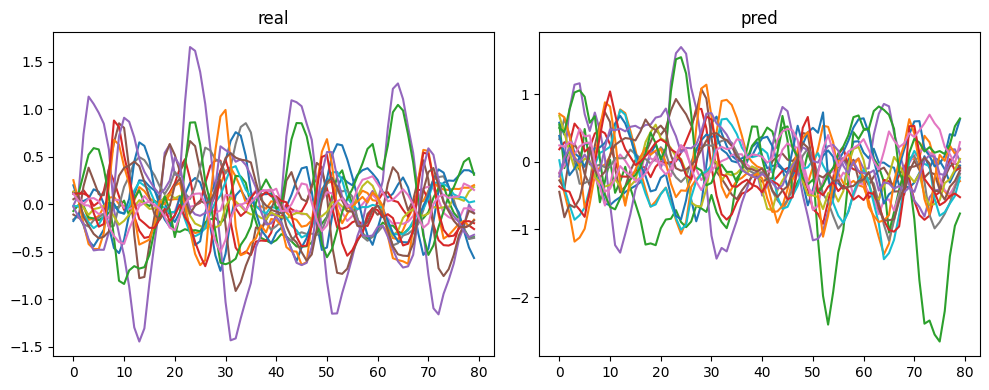

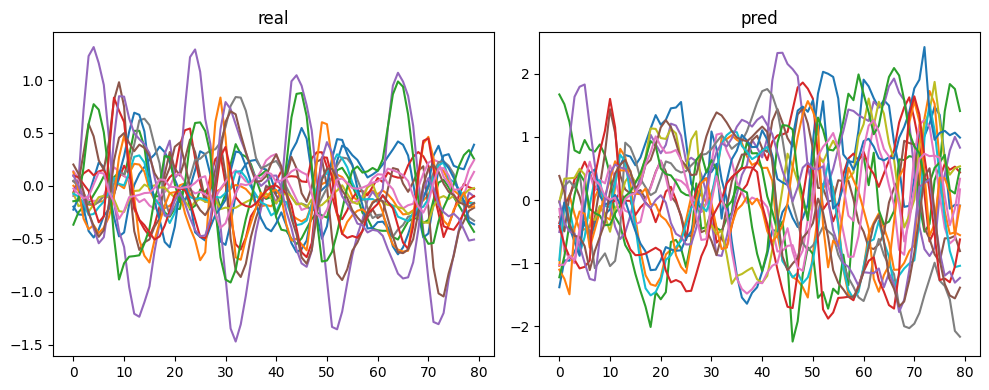

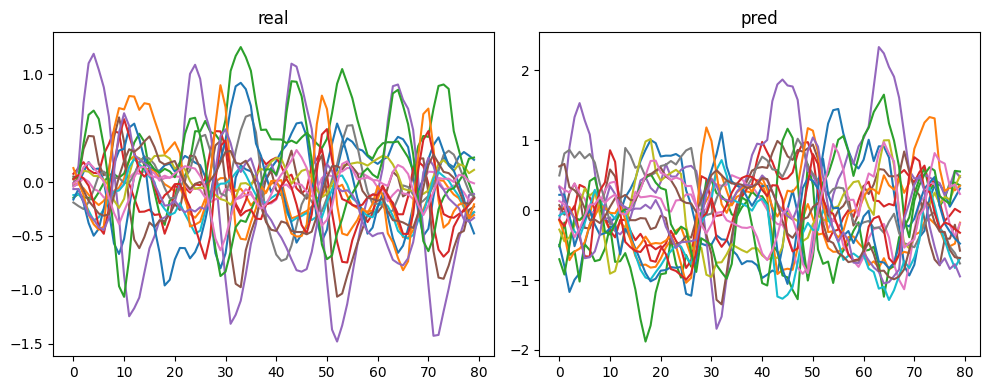

In [57]:
for ind in clothings:
    # Create a figure and a set of subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    # Plot data on each subplot
    axs[0].plot(test_meg[ind].T);
    axs[0].set_title('real')
    axs[1].plot(pred_meg[ind].T);
    axs[1].set_title('pred')
    # fig.suptitle('coverall')
    plt.tight_layout()
    plt.show()

In [35]:
# plt.plot(X_pred.reshape(test_meg.shape)[2].T);